In [1]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [2]:
import numpy as np
import os
import pandas as pd
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import imageio
import tensorflow
import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.python.keras.models import Sequential
from tensorflow.python.keras.layers import Dense, Flatten
from keras import layers

In [3]:
metadata = pd.read_csv('/content/drive/MyDrive/Datasets/HAM10000_metadata.csv')

le = LabelEncoder()
le.fit(metadata['dx'])
LabelEncoder()
print("All Skin Cancer Lesions Classes:", list(le.classes_))

metadata['label'] = le.transform(metadata["dx"]) 
metadata.sample(10)

All Skin Cancer Lesions Classes: ['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']


,lesion_id,image_id,dx,dx_type,age,sex,localization,dataset,label
5686,HAM_0000254,ISIC_0026939,nv,follow_up,45.0,female,trunk,vidir_molemax,5
7865,HAM_0004118,ISIC_0032593,nv,histo,30.0,female,trunk,vidir_modern,5
9639,HAM_0000057,ISIC_0026391,nv,consensus,30.0,male,unknown,vidir_modern,5
9194,HAM_0007228,ISIC_0025681,nv,histo,70.0,male,upper extremity,rosendahl,5
8946,HAM_0002647,ISIC_0030534,nv,histo,50.0,female,back,rosendahl,5
9829,HAM_0003939,ISIC_0027172,akiec,histo,75.0,male,face,rosendahl,0
4486,HAM_0003454,ISIC_0031764,nv,follow_up,55.0,female,lower extremity,vidir_molemax,5
1869,HAM_0000706,ISIC_0033668,mel,histo,50.0,male,face,vidir_modern,4
3289,HAM_0002138,ISIC_0027834,nv,follow_up,45.0,male,abdomen,vidir_molemax,5
9967,HAM_0000462,ISIC_0033869,akiec,histo,60.0,female,lower extremity,vidir_modern,0


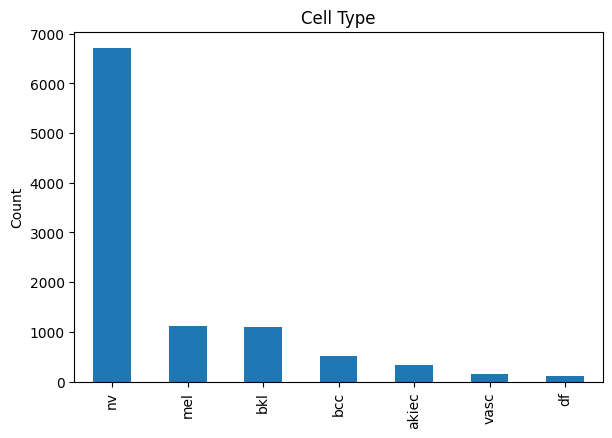

In [ ]:
fig = plt.figure(figsize=(15,10))
ax1 = fig.add_subplot(221)
metadata['dx'].value_counts().plot(kind='bar', ax=ax1)
ax1.set_ylabel('Count')
ax1.set_title('Cell Type');

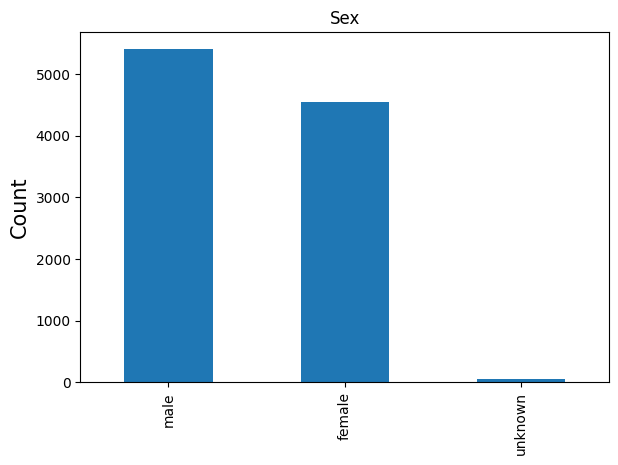

In [ ]:
fig = plt.figure(figsize=(15,10))
ax2 = fig.add_subplot(222)
metadata['sex'].value_counts().plot(kind='bar', ax=ax2)
ax2.set_ylabel('Count', size=15)
ax2.set_title('Sex');

Text(0.5, 1.0, 'Localization')

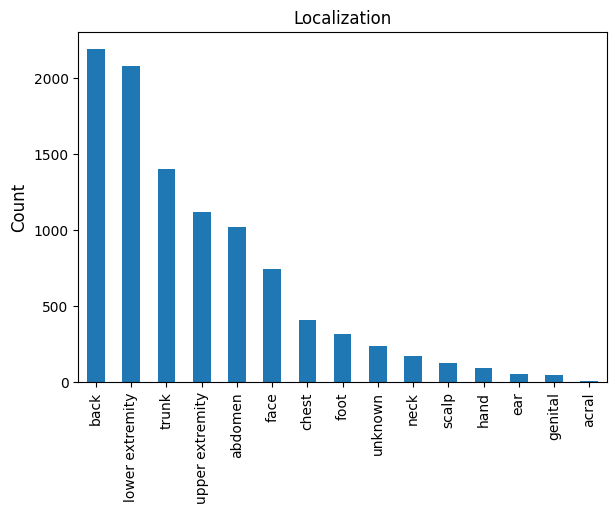

In [ ]:
fig = plt.figure(figsize=(15,10))

ax3 = fig.add_subplot(223)
metadata['localization'].value_counts().plot(kind='bar')
ax3.set_ylabel('Count',size=12)
ax3.set_title('Localization')

Text(0.5, 1.0, 'Age')

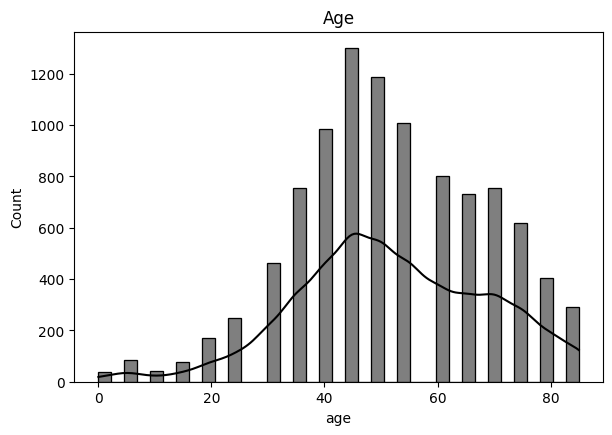

In [ ]:
fig = plt.figure(figsize=(15,10))

ax4 = fig.add_subplot(224)
sample_age = metadata[pd.notnull(metadata['age'])]
sns.histplot(sample_age['age'], color='black',kde=True);
ax4.set_title('Age')

In [4]:
dest_dir = os.getcwd() + "/drive/MyDrive/Datasets/dataset/"
label = [ 'akiec', 'bcc','bkl','df','mel', 'nv',  'vasc']
label_images = []
classes = [ 'actinic keratoses', 'basal cell carcinoma', 'benign keratosis-like lesions', 
           'dermatofibroma','melanoma', 'melanocytic nevi', 'vascular lesions']

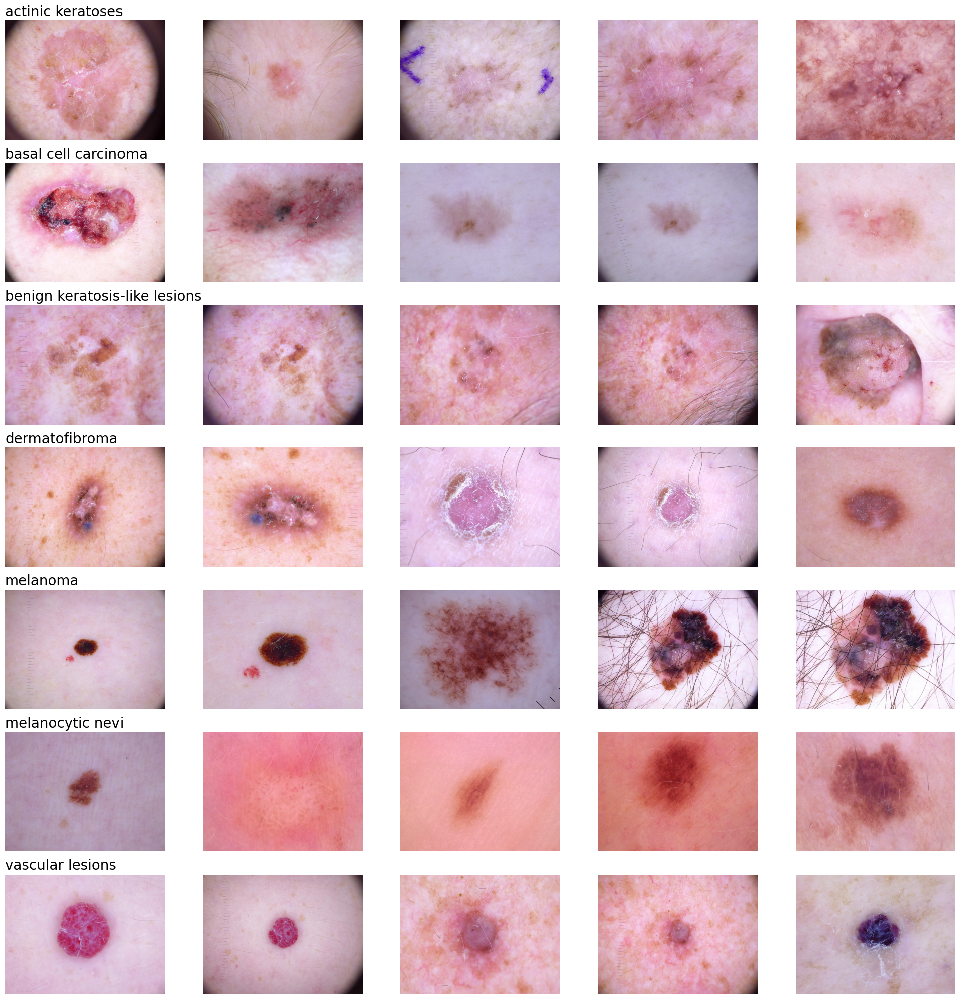

In [ ]:
#Visualizing the images
dest_dir = os.getcwd() + "/drive/MyDrive/Datasets/dataset/"
label = [ 'akiec', 'bcc','bkl','df','mel', 'nv',  'vasc']
label_images = []
classes = [ 'actinic keratoses', 'basal cell carcinoma', 'benign keratosis-like lesions', 
           'dermatofibroma','melanoma', 'melanocytic nevi', 'vascular lesions']

fig = plt.figure(figsize=(20, 20))
k = range(7)

for i in label:
    sample = metadata[metadata['dx'] == i]['image_id'][:5]
    label_images.extend(sample)
    
for position,ID in enumerate(label_images):
    labl = metadata[metadata['image_id'] == ID]['dx']
    im_sample = dest_dir + "/" + labl.values[0] + f'/{ID}.jpg'
    im_sample = imageio.v2.imread(im_sample)

    plt.subplot(7,5,position+1)
    plt.imshow(im_sample)
    plt.axis('off')

    if position%5 == 0:
        title = int(position/5)
        plt.title(classes[title], loc='left', size=20)

plt.tight_layout()
plt.show()

# splitting the dataset

import os
import shutil

data_dir =os.getcwd() +  "/content/drive/MyDrive/Datasets/SkinLesion/"

dest_dir = os.getcwd() + "/content/drive/MyDrive/Datasets/dataset/"

metadata = pd.read_csv('/content/drive/MyDrive/Datasets/HAM10000_metadata.csv')
label = ['df', 'nv', 'bkl', 'mel', 'vasc', 'bcc', 'akiec']
label_images = []

os.makedirs(dest_dir, exist_ok=True)

for i in label:
    if not os.path.exists(dest_dir + str(i) + "/"):
        os.mkdir(dest_dir + str(i) + "/")
    sample = metadata[metadata['dx'] == i]['image_id']
    label_images.extend(sample)
    for id in label_images:
        shutil.copyfile((data_dir + id +".jpg"), (dest_dir + i + "/"+id+".jpg"))
    label_images=[]


# Imbalance

dest_dir = os.getcwd() + "/drive/MyDrive/Datasets/dataset/"
label = [ 'akiec', 'bcc','bkl','df','mel', 'nv',  'vasc']


In [ ]:
class_weights = np.zeros_like(label, dtype=float)
counts = np.zeros_like(label)
for i,l in enumerate(label):
    counts[i] = metadata[metadata['dx']==str(l)]['dx'].value_counts()[0]
counts = counts.astype(float)
counts

array([ 327.,  514., 1099.,  115., 1113., 6705.,  142.])

In [ ]:
class_samples_list = [ 327,  514, 1099,  115, 1113, 6705, 142]
num_classes = len(class_samples_list)
total_samples = np.sum(class_samples_list)

class_weight = {class_label: total_samples / (num_classes * class_samples) for class_label, class_samples in enumerate(class_samples_list)}
print(class_weight)

{0: 4.375273044997815, 1: 2.78349082823791, 2: 1.301832835044846, 3: 12.440993788819876, 4: 1.2854575792581184, 5: 0.21338020666879728, 6: 10.075452716297788}


# train test split

In [5]:
!pip install split-folders

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [6]:
import splitfolders
splitfolders.ratio('/content/drive/MyDrive/Datasets/dataset', output="/dataset_final/", seed=1337, ratio=(.7, 0.1,0.2)) 

Copying files: 10020 files [06:23, 26.15 files/s]


In [7]:
train_dir="/dataset_final/train"
val_dir="/dataset_final/val"
test_dir="/dataset_final/test"

In [8]:

datagen= ImageDataGenerator(rotation_range=0.2,
                            width_shift_range=0.2,
                            height_shift_range=0.2,
                            shear_range=0.2,
                            zoom_range=0.2,
                            horizontal_flip=True,
                            vertical_flip=True)

train_gen=datagen.flow_from_directory(train_dir,target_size=(224,224),batch_size=16)
val_gen=datagen.flow_from_directory(val_dir,target_size=(224,224),batch_size=16)
test_gen=datagen.flow_from_directory(test_dir,target_size=(224,224),batch_size=16)

Found 7010 images belonging to 7 classes.
Found 999 images belonging to 7 classes.
Found 2011 images belonging to 7 classes.


In [ ]:
images, labels = next(train_gen)

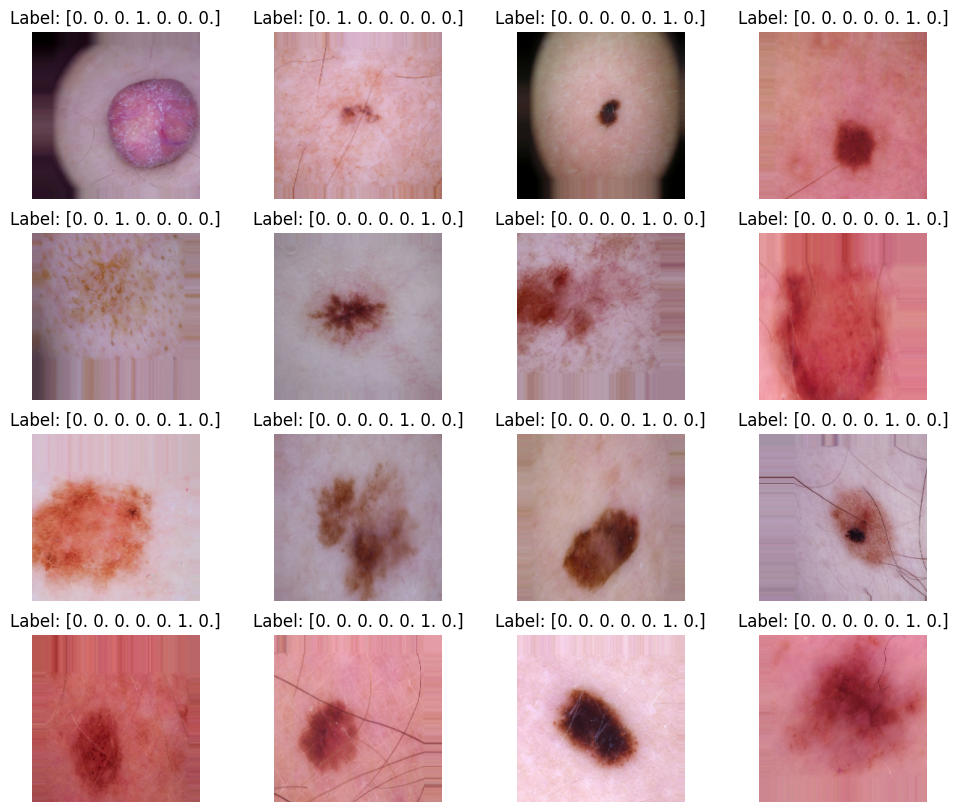

In [ ]:
# Get a batch of images and labels
images, labels = next(train_gen)

# Display the images
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(12,10))
for i, ax in enumerate(axes.flat):
    image = (images[i]).astype(np.uint8)
    # Plot the image
    ax.imshow(image)
    ax.axis('off')
    ax.set_title(f'Label: {labels[i]}')
plt.show()


# Building models

## Pre trained Resnet(No Fine Tuning)

In [ ]:
base_model = ResNet50(input_shape=(224, 224,3), include_top=False, weights="imagenet")

94765736/94765736 [==============================] - 5s 0us/step


In [ ]:
for layer in base_model.layers:
    layer.trainable = False

In [ ]:
import tensorflow as tf
tf.keras.utils.plot_model(
base_model,
to_file="model.png",
show_shapes=True,
show_dtype=False,
show_layer_names=True,
rankdir="TB",
expand_nested=True,
dpi=96,
layer_range=None,
show_layer_activations=True,
)

In [ ]:
!pip install visualkeras
import visualkeras
from PIL import ImageFont
visualkeras.layered_view(base_model, legend=True)

In [ ]:
base_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

from tensorflow.keras.applications import ResNet50
from tensorflow.python.keras.models import Sequential
from tensorflow.python.keras.layers import Dense, Flatten, GlobalAveragePooling2D

base_model = Sequential()
base_model.add(ResNet50(include_top=True, weights='imagenet', pooling='max'))
# base_model.add(keras.layers.Flatten(input_shape=[224,224]))
base_model.add(Dense(10, activation='softmax'))
base_model.add(keras.layers.Dropout(0.3))
base_model.add(Dense(50, activation='softmax'))
base_model.add(keras.layers.Dropout(0.3))
base_model.add(Dense(7, activation='softmax'))

In [ ]:
x = layers.Flatten()(base_model.output)
x = layers.Dense(10, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(50, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(7,activation='softmax')(x)
model = tensorflow.keras.models.Model(base_model.input, x)

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

In [ ]:
model.compile(loss="categorical_crossentropy",optimizer='rmsprop',metrics=['acc'])

In [ ]:
model.input

<KerasTensor: shape=(None, 224, 224, 3) dtype=float32 (created by layer 'input_1')>

In [ ]:
model.output

<KerasTensor: shape=(None, 7) dtype=float32 (created by layer 'dense_2')>

In [ ]:
train_gen.next()[0].shape

(16, 224, 224, 3)

In [ ]:
resnet_history = model.fit(train_gen, validation_data = val_gen, epochs = 5)

Epoch 1/5
439/439 [==============================] - 249s 539ms/step - loss: 1.4047 - acc: 0.6665 - val_loss: 1.1325 - val_acc: 0.6707
Epoch 2/5
439/439 [==============================] - 215s 491ms/step - loss: 1.1563 - acc: 0.6695 - val_loss: 1.1273 - val_acc: 0.6707
Epoch 3/5
439/439 [==============================] - 228s 521ms/step - loss: 1.1604 - acc: 0.6695 - val_loss: 1.1268 - val_acc: 0.6707
Epoch 4/5
439/439 [==============================] - 192s 439ms/step - loss: 1.1503 - acc: 0.6695 - val_loss: 1.1276 - val_acc: 0.6707
Epoch 5/5
439/439 [==============================] - 184s 419ms/step - loss: 1.1496 - acc: 0.6695 - val_loss: 1.1269 - val_acc: 0.6707


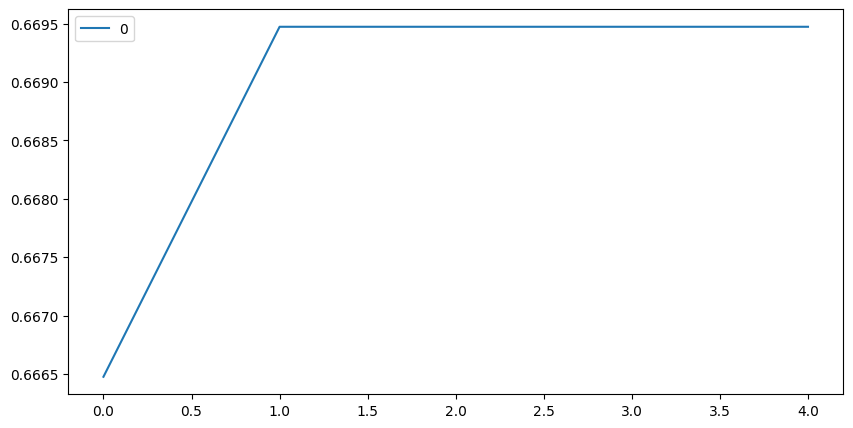

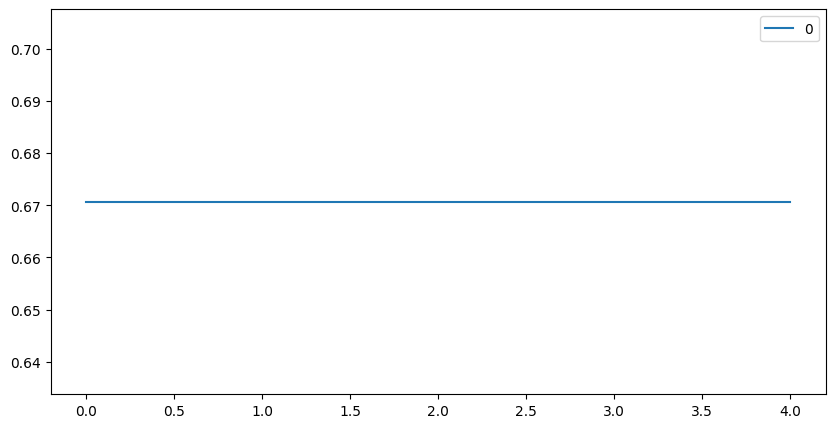

In [ ]:
plt=pd.DataFrame(resnet_history.history['acc']).plot(figsize=[10,5])#.axis(ymin=0,ymax=1.2,xmin=0,xmax=10)
plt=pd.DataFrame(resnet_history.history['val_acc']).plot(figsize=[10,5])#.axis(ymin=0,ymax=1.2,xmin=0,xmax=10)

In [ ]:
model.evaluate(test_gen)

126/126 [==============================] - 50s 397ms/step - loss: 1.1382 - acc: 0.6673


[1.1381666660308838, 0.6673296689987183]

# Pre trained Resnet(Fine Tuning)

In [ ]:
len(base_model.layers[:-20])

155

In [ ]:
base_model_1 = ResNet50(input_shape=(224, 224,3), include_top=False, weights="imagenet")
for layer in base_model_1.layers[:-20]:
    layer.trainable = False
base_model_1.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [ ]:
x = layers.Flatten()(base_model_1.output)
x = layers.Dense(10, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(50, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(7,activation='softmax')(x)
model_1 = tensorflow.keras.models.Model(base_model_1.input, x)

In [ ]:
model_1.compile(loss="categorical_crossentropy",optimizer='rmsprop',metrics=['acc'])

In [ ]:
resnet_history_1 = model_1.fit(train_gen, validation_data = val_gen, epochs = 5)

Epoch 1/5
439/439 [==============================] - 196s 424ms/step - loss: 1.4412 - acc: 0.6660 - val_loss: 1.1316 - val_acc: 0.6707
Epoch 2/5
439/439 [==============================] - 185s 421ms/step - loss: 1.1583 - acc: 0.6695 - val_loss: 1.1267 - val_acc: 0.6707
Epoch 3/5
439/439 [==============================] - 184s 419ms/step - loss: 1.1518 - acc: 0.6695 - val_loss: 1.1267 - val_acc: 0.6707
Epoch 4/5
439/439 [==============================] - 185s 422ms/step - loss: 1.1503 - acc: 0.6695 - val_loss: 1.1270 - val_acc: 0.6707
Epoch 5/5
439/439 [==============================] - 204s 465ms/step - loss: 1.1519 - acc: 0.6695 - val_loss: 1.1282 - val_acc: 0.6707


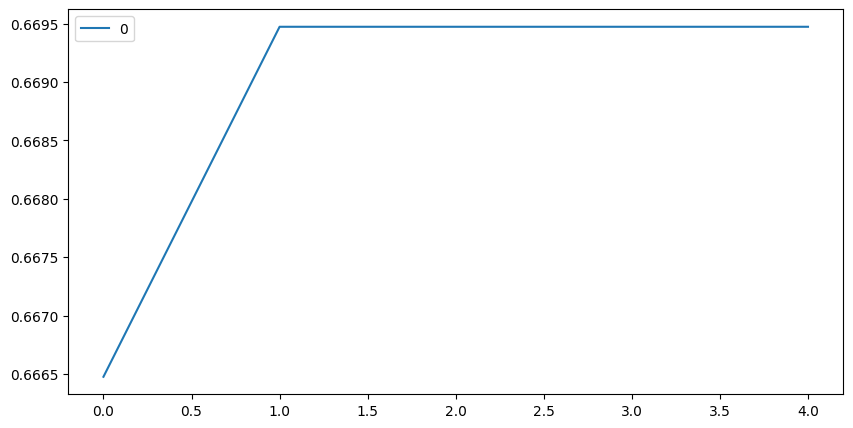

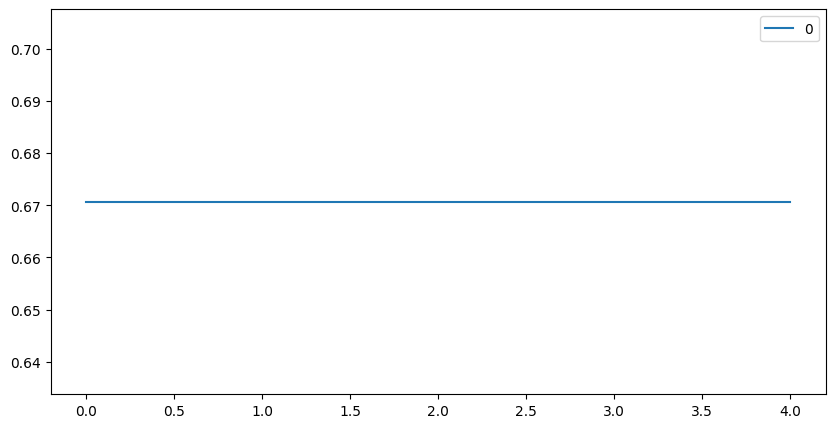

In [ ]:
plt=pd.DataFrame(resnet_history.history['acc']).plot(figsize=[10,5])#.axis(ymin=0,ymax=1.2,xmin=0,xmax=10)
plt=pd.DataFrame(resnet_history.history['val_acc']).plot(figsize=[10,5])#.axis(ymin=0,ymax=1.2,xmin=0,xmax=10)

In [ ]:
model_1.evaluate(test_gen)

126/126 [==============================] - 47s 371ms/step - loss: 1.1389 - acc: 0.6673


[1.1389340162277222, 0.6673296689987183]

# Resnet101 pretrained

In [ ]:
from tensorflow.keras.applications import ResNet101
base_model_101 = ResNet101(input_shape=(224, 224,3), include_top=False, weights="imagenet")
for layer in base_model_101.layers:
    layer.trainable = False

171446536/171446536 [==============================] - 9s 0us/step


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.879486 to fit



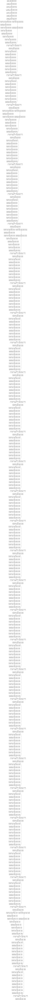

In [ ]:
import tensorflow as tf
tf.keras.utils.plot_model(
base_model_101,
to_file="model.png",
show_shapes=True,
show_dtype=False,
show_layer_names=True,
rankdir="TB",
expand_nested=True,
dpi=96,
layer_range=None,
show_layer_activations=True,
)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 992.0/992.0 kB 59.3 MB/s eta 0:00:00


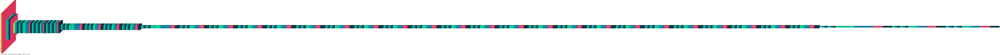

In [ ]:
!pip install visualkeras
import visualkeras
from PIL import ImageFont
visualkeras.layered_view(base_model_101, legend=True)

In [ ]:
x = layers.Flatten()(base_model_101.output)
x = layers.Dense(10, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(50, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(7,activation='softmax')(x)
model_101 = tensorflow.keras.models.Model(base_model_101.input, x)

In [ ]:
model_101.compile(loss="categorical_crossentropy",optimizer='rmsprop',metrics=['acc'])

In [ ]:
resnet_history_101 = model_101.fit(train_gen, validation_data = val_gen, epochs = 5)

Epoch 1/5
439/439 [==============================] - 194s 427ms/step - loss: 1.5443 - acc: 0.6652 - val_loss: 1.1368 - val_acc: 0.6707
Epoch 2/5
439/439 [==============================] - 186s 424ms/step - loss: 1.1603 - acc: 0.6695 - val_loss: 1.1269 - val_acc: 0.6707
Epoch 3/5
439/439 [==============================] - 205s 468ms/step - loss: 1.1588 - acc: 0.6695 - val_loss: 1.1280 - val_acc: 0.6707
Epoch 4/5
439/439 [==============================] - 186s 423ms/step - loss: 1.1690 - acc: 0.6692 - val_loss: 1.1270 - val_acc: 0.6707
Epoch 5/5
439/439 [==============================] - 205s 466ms/step - loss: 1.1526 - acc: 0.6695 - val_loss: 1.1272 - val_acc: 0.6707


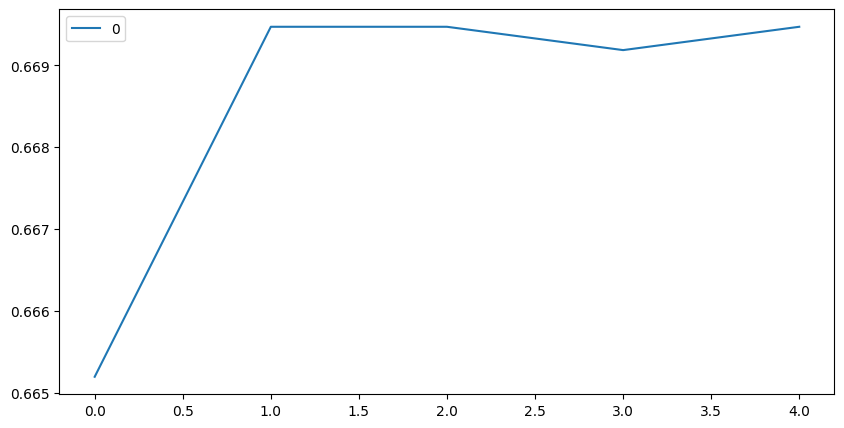

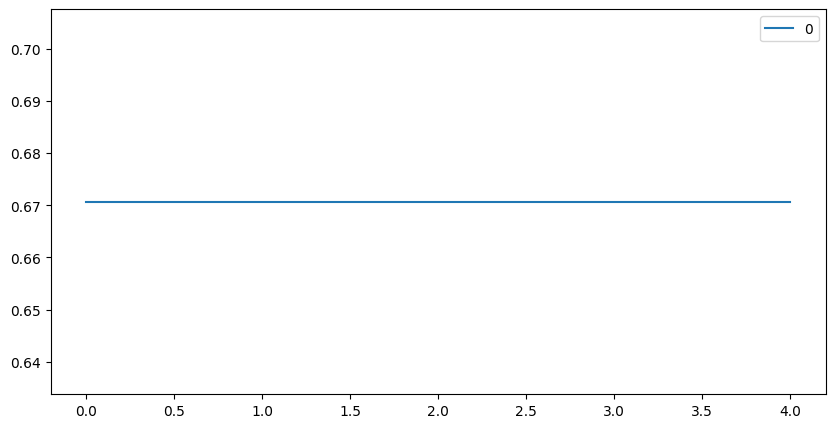

In [ ]:
plt=pd.DataFrame(resnet_history_101.history['acc']).plot(figsize=[10,5])#.axis(ymin=0,ymax=1.2,xmin=0,xmax=10)
plt=pd.DataFrame(resnet_history_101.history['val_acc']).plot(figsize=[10,5])#.axis(ymin=0,ymax=1.2,xmin=0,xmax=10)

In [ ]:
model_101.evaluate(test_gen)

126/126 [==============================] - 59s 468ms/step - loss: 1.1382 - acc: 0.6673


[1.1381500959396362, 0.6673296689987183]

# Resnet 152

In [ ]:
from tensorflow.keras.applications import ResNet152
base_model_152 = ResNet152(input_shape=(224, 224,3), include_top=False, weights="imagenet")
for layer in base_model_152.layers:
    layer.trainable = False

234698864/234698864 [==============================] - 11s 0us/step


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.584384 to fit



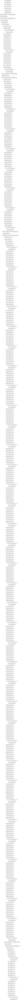

In [ ]:
import tensorflow as tf
tf.keras.utils.plot_model(
base_model_152,
to_file="model.png",
show_shapes=True,
show_dtype=False,
show_layer_names=True,
rankdir="TB",
expand_nested=True,
dpi=96,
layer_range=None,
show_layer_activations=True,
)

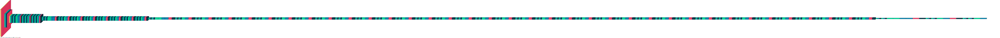

In [ ]:
import visualkeras
from PIL import ImageFont
visualkeras.layered_view(base_model_152, legend=True)

In [ ]:
x = layers.Flatten()(base_model_152.output)
x = layers.Dense(10, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(50, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(7,activation='softmax')(x)
model_152 = tensorflow.keras.models.Model(base_model_152.input, x)

In [ ]:
model_152.compile(loss="categorical_crossentropy",optimizer='rmsprop',metrics=['acc'])

In [ ]:
resnet_history_152 = model_152.fit(train_gen, validation_data = val_gen, epochs = 5)

Epoch 1/5
439/439 [==============================] - 206s 449ms/step - loss: 1.4417 - acc: 0.6670 - val_loss: 1.1363 - val_acc: 0.6707
Epoch 2/5
439/439 [==============================] - 193s 439ms/step - loss: 1.1615 - acc: 0.6695 - val_loss: 1.1278 - val_acc: 0.6707
Epoch 3/5
439/439 [==============================] - 192s 438ms/step - loss: 1.1618 - acc: 0.6692 - val_loss: 1.1262 - val_acc: 0.6707
Epoch 4/5
439/439 [==============================] - 191s 436ms/step - loss: 1.1524 - acc: 0.6695 - val_loss: 1.1269 - val_acc: 0.6707
Epoch 5/5
439/439 [==============================] - 198s 450ms/step - loss: 1.1519 - acc: 0.6695 - val_loss: 1.1269 - val_acc: 0.6707


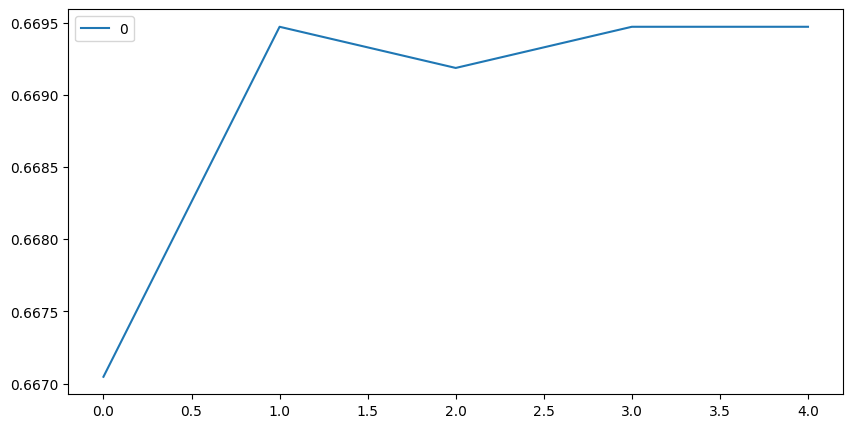

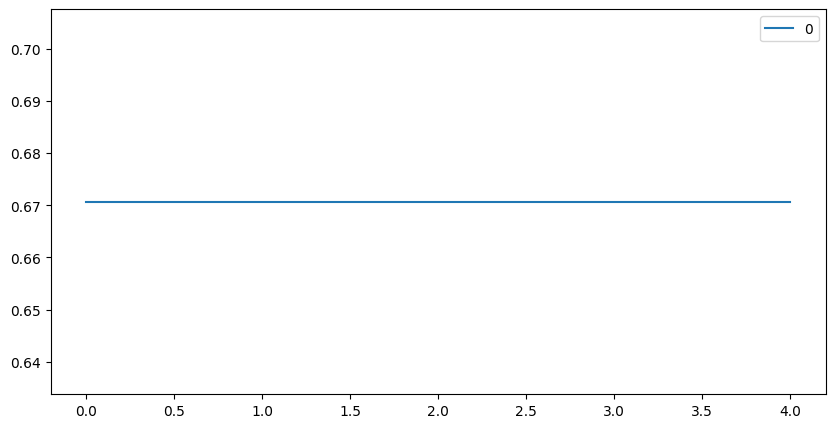

In [ ]:
plt=pd.DataFrame(resnet_history_152.history['acc']).plot(figsize=[10,5])#.axis(ymin=0,ymax=1.2,xmin=0,xmax=10)
plt=pd.DataFrame(resnet_history_152.history['val_acc']).plot(figsize=[10,5])#.axis(ymin=0,ymax=1.2,xmin=0,xmax=10)

In [ ]:
model_152.evaluate(test_gen)

126/126 [==============================] - 53s 422ms/step - loss: 1.1382 - acc: 0.6673


[1.1382240056991577, 0.6673296689987183]

# increacing fc layer

In [ ]:
x = layers.Flatten()(base_model.output)
x = layers.Dense(20, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(50, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(75, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(50, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(7,activation='softmax')(x)
model_2 = tensorflow.keras.models.Model(base_model.input, x)

In [ ]:
model_2.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

In [ ]:
model_2.compile(loss="categorical_crossentropy",optimizer='rmsprop',metrics=['acc'])

In [ ]:
resnet_history_2 = model_2.fit(train_gen, validation_data = val_gen, epochs = 5)

Epoch 1/5
439/439 [==============================] - 190s 423ms/step - loss: 1.5170 - acc: 0.6628 - val_loss: 1.1291 - val_acc: 0.6707
Epoch 2/5
439/439 [==============================] - 181s 412ms/step - loss: 1.2549 - acc: 0.6692 - val_loss: 1.1275 - val_acc: 0.6707
Epoch 3/5
439/439 [==============================] - 180s 411ms/step - loss: 1.1592 - acc: 0.6695 - val_loss: 1.1270 - val_acc: 0.6707
Epoch 4/5
439/439 [==============================] - 180s 411ms/step - loss: 1.1556 - acc: 0.6695 - val_loss: 1.1295 - val_acc: 0.6707
Epoch 5/5
439/439 [==============================] - 199s 453ms/step - loss: 1.1514 - acc: 0.6695 - val_loss: 1.1291 - val_acc: 0.6707


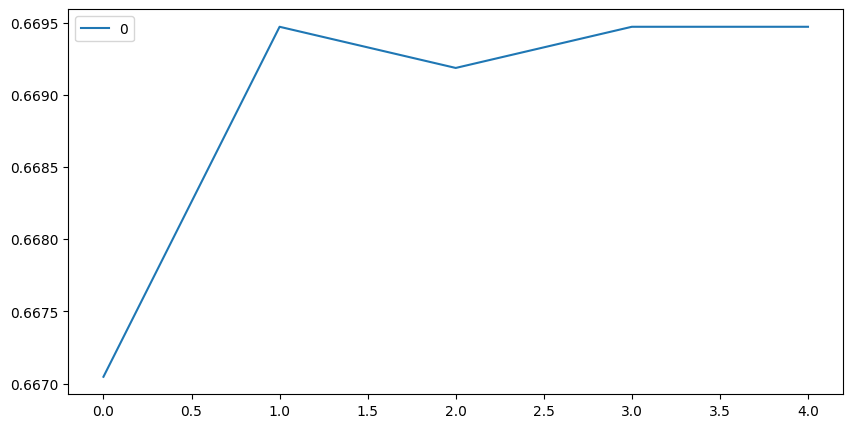

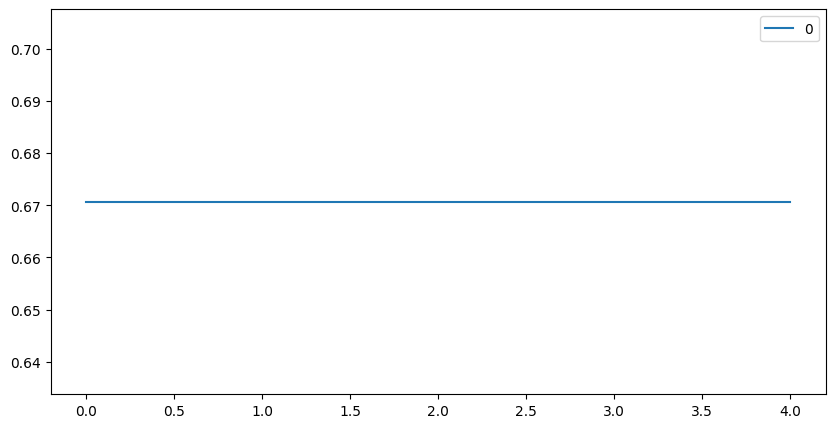

In [ ]:
plt=pd.DataFrame(resnet_history_2.history['acc']).plot(figsize=[10,5])#.axis(ymin=0,ymax=1.2,xmin=0,xmax=10)
plt=pd.DataFrame(resnet_history_2.history['val_acc']).plot(figsize=[10,5])#.axis(ymin=0,ymax=1.2,xmin=0,xmax=10)

In [ ]:
model_2.evaluate(test_gen)

126/126 [==============================] - 47s 374ms/step - loss: 1.1396 - acc: 0.6673


[1.1396205425262451, 0.6673296689987183]

# More Augmentation

In [ ]:
datagen= ImageDataGenerator(rotation_range=0.5,
                            width_shift_range=0.5,
                            height_shift_range=0.5,
                            shear_range=0.5,
                            zoom_range=0.5,
                            horizontal_flip=True,
                            vertical_flip=True)

train_gen=datagen.flow_from_directory(train_dir,target_size=(224,224),batch_size=16)
val_gen=datagen.flow_from_directory(val_dir,target_size=(224,224),batch_size=16)
test_gen=datagen.flow_from_directory(test_dir,target_size=(224,224),batch_size=16)

Found 7010 images belonging to 7 classes.
Found 999 images belonging to 7 classes.
Found 2011 images belonging to 7 classes.


In [ ]:
x = layers.Flatten()(base_model.output)
x = layers.Dense(20, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(50, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(75, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(50, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(7,activation='softmax')(x)
model_3 = tensorflow.keras.models.Model(base_model.input, x)

In [ ]:
model_3.compile(loss="categorical_crossentropy",optimizer='rmsprop',metrics=['acc'])

In [ ]:
checkpoint_cb= keras.callbacks.ModelCheckpoint("Bestmodel.h5",save_best_only=True)

In [ ]:
resnet_history_3 = model_3.fit(train_gen, validation_data = val_gen, epochs = 5,callbacks=[checkpoint_cb])

Epoch 1/5
439/439 [==============================] - 279s 530ms/step - loss: 1.5086 - acc: 0.6559 - val_loss: 1.1330 - val_acc: 0.6707
Epoch 2/5
439/439 [==============================] - 195s 444ms/step - loss: 1.8818 - acc: 0.6692 - val_loss: 1.3242 - val_acc: 0.6707
Epoch 3/5
439/439 [==============================] - 193s 440ms/step - loss: 1.5376 - acc: 0.6695 - val_loss: 488.9901 - val_acc: 0.6707
Epoch 4/5
439/439 [==============================] - 194s 442ms/step - loss: 1.5821 - acc: 0.6695 - val_loss: 1.0618 - val_acc: 0.6707
Epoch 5/5
439/439 [==============================] - 193s 439ms/step - loss: 1.5337 - acc: 0.6695 - val_loss: 16.8211 - val_acc: 0.6707


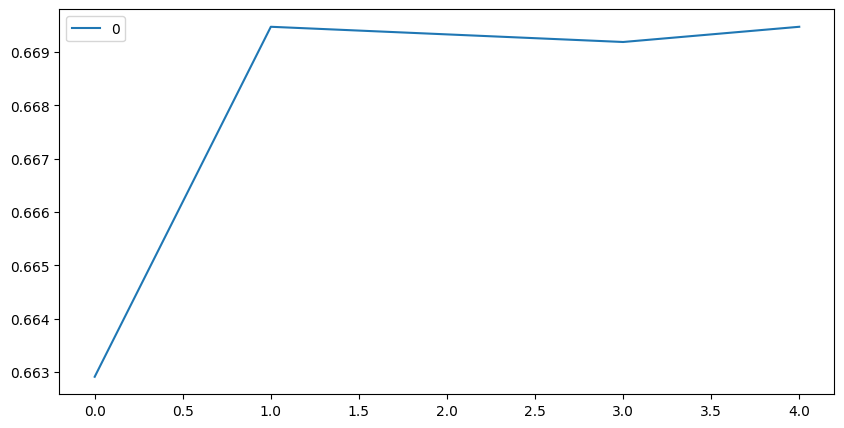

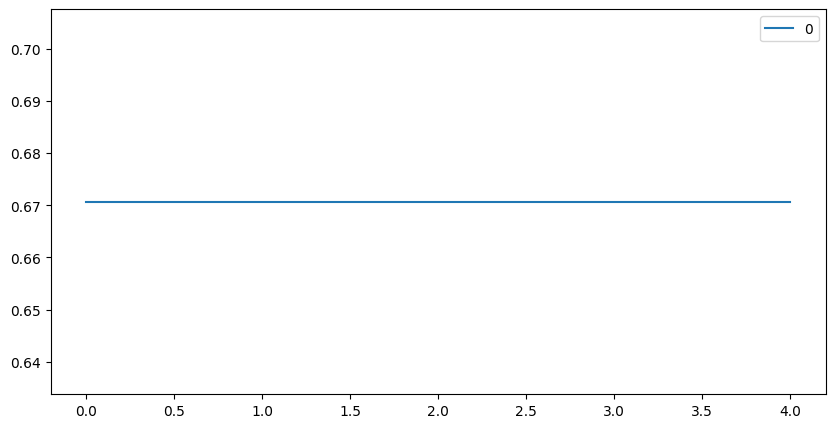

In [ ]:
plt=pd.DataFrame(resnet_history_3.history['acc']).plot(figsize=[10,5])#.axis(ymin=0,ymax=1.2,xmin=0,xmax=10)
plt=pd.DataFrame(resnet_history_3.history['val_acc']).plot(figsize=[10,5])#.axis(ymin=0,ymax=1.2,xmin=0,xmax=10)

In [ ]:
model_3.evaluate(test_gen)

126/126 [==============================] - 46s 365ms/step - loss: 1.1366 - acc: 0.6673


[1.1366260051727295, 0.6673296689987183]

# Testing for an output

In [ ]:
import cv2 as cv
import tensorflow as tf

In [ ]:
image = cv.imread('/content/ISIC_0024372.jpg')

In [ ]:
image.shape

(450, 600, 3)

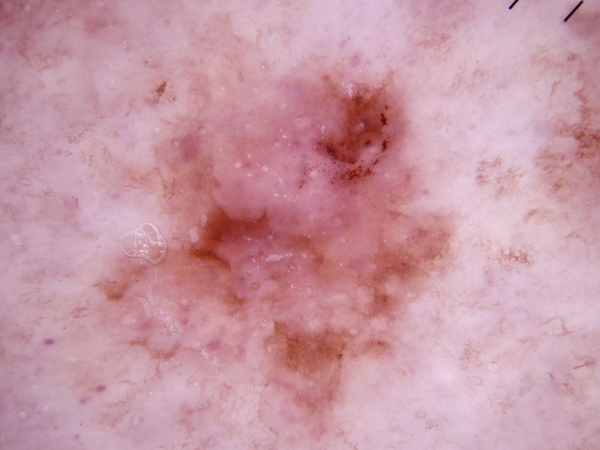

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow(image)

In [ ]:
def crop_resize(img):
  image_1_resize = cv.resize(img,(224,224))
  return image_1_resize

In [ ]:
image=crop_resize(image)
image.shape

(224, 224, 3)

In [ ]:
image = tf.expand_dims(image, axis=0)
image.shape.as_list()


[1, 224, 224, 3]

In [ ]:
yproba = model_3.predict(image)
yproba

1/1 [==============================] - 0s 27ms/step


array([[0.0373145 , 0.06412525, 0.13643502, 0.0096856 , 0.1307372 ,
        0.60658735, 0.01511508]], dtype=float32)

In [ ]:
class_name=classes[np.argmax(yproba,axis=1)[0]]

In [ ]:
class_name

'melanocytic nevi'